In [1]:
import numpy as np
import sys
sys.path.insert(0, "../src/")
import matplotlib
%matplotlib inline
from scipy.integrate import trapz as integr
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error as MSE
from data import Sample, smooth, Spectra, SpectraTheory, Image
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import pickle
from fitting import NNLS
from camera import TheorSample, CameraCalibration, MetaSpectraCalibration
import os, re
from skimage import io
%load_ext autoreload
%autoreload 2

In /home/makam0a/anaconda3/envs/prima/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /home/makam0a/anaconda3/envs/prima/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.level rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /home/makam0a/anaconda3/envs/prima/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.


In [3]:
DATA = '../data/'
METADATA = '../metadata/'

In [4]:
datadir= DATA + 'final/' + 'Camera calibration/'
image_type = 'LU'
filelist=sorted(os.listdir(datadir),key=lambda s: [int(t) if t.isdigit() else t.lower() for t in re.split('(\d+)', s)]) 
sample_file_names= [os.path.splitext(file)[0][:-3] for file in filelist if file.endswith('.tif')]
sample_type = 'A'
mirror = 'mirr'+sample_type
a_samples=[sample for sample in sample_file_names if (sample[0] == sample_type) and (os.path.exists(datadir+sample+'_' + image_type + '.tif'))]
sample_type = 'B'
b_samples=[sample for sample in sample_file_names if (sample[0] == sample_type) and (os.path.exists(datadir+sample+'_' + image_type+'.tif'))]
sample_type = 'C'
c_samples=[sample for sample in sample_file_names if (sample[0] == sample_type) and (os.path.exists(datadir+sample+'_' + image_type+'.tif'))]
sample_type = 'D'
d_samples=[sample for sample in sample_file_names if (sample[0] == sample_type) and (os.path.exists(datadir+sample+'_' + image_type+'.tif'))]

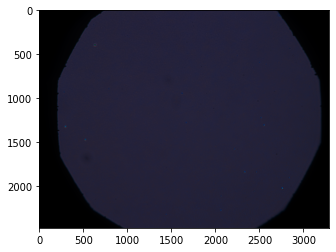

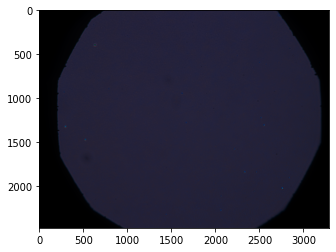

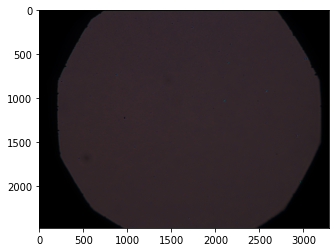

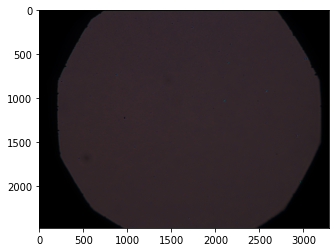

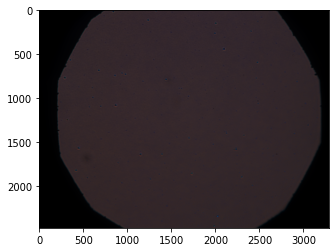

...

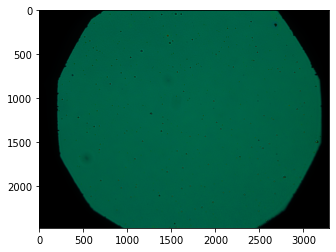

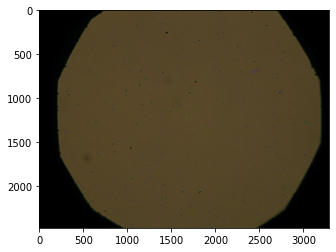

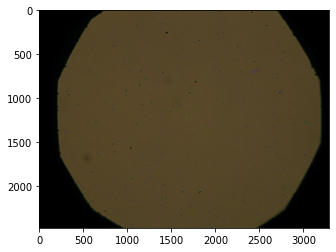

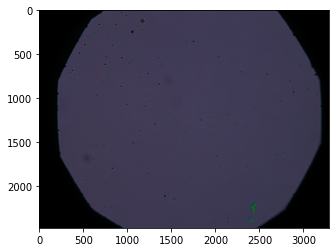

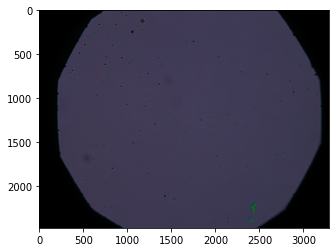

In [24]:
for image_type in ['LD', 'LU']:
    for sample in a_samples + b_samples:
        p = io.imread(datadir+sample+'_' + image_type+'.tif')/2**14
        io.imsave(DATA+'final/processed/'+sample+image_type.lower()+'.tiff', p)
        plt.imshow(p)
        plt.show()

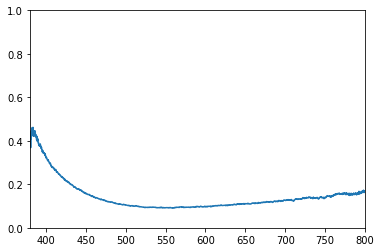

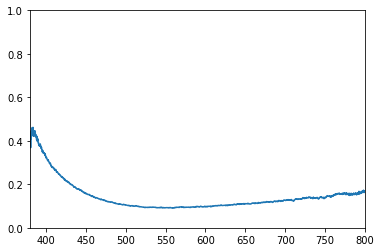

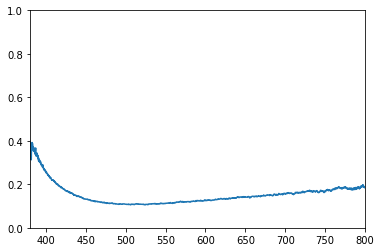

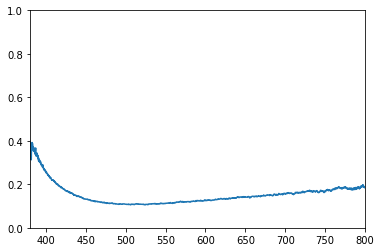

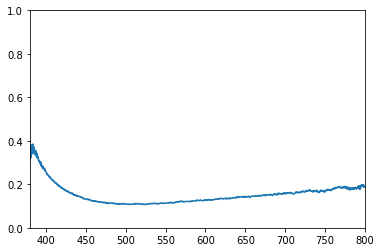

...

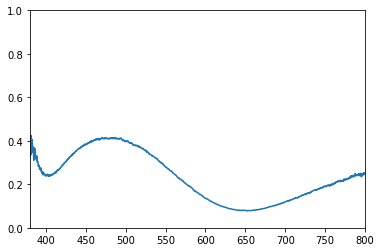

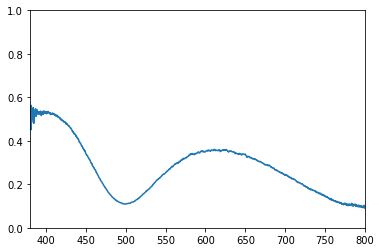

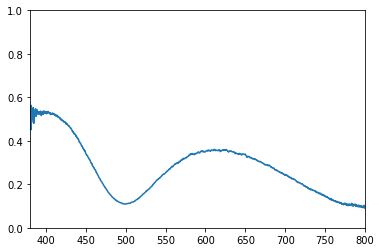

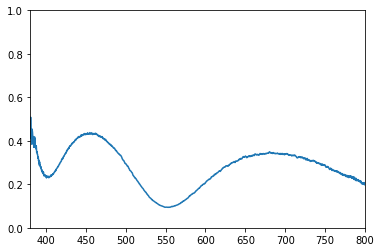

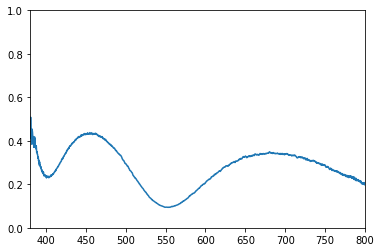

In [27]:
for image_type in ['LD', 'LU']:
    for sample in a_samples + b_samples:
        s=np.loadtxt(datadir + sample+ '.txt',skiprows=14)
        s[:,1]/=100
        wl, sp = s[:,0], s[:,1]
        np.savetxt(DATA+'final/processed/'+sample+'.csv', s, delimiter=";")
        plt.plot(wl, sp)
        plt.xlim(380,800)
        plt.ylim(0,1)
        plt.show()

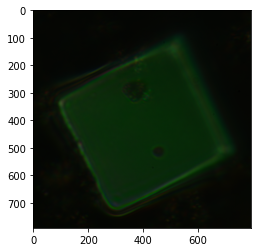

In [31]:
datadir= DATA + 'final/' + 'Fake cells/crops/'
sample = 'Green11_LU_crop'
p = io.imread(datadir+ sample + '.tif')/2**14
io.imsave(DATA+'final/processed/' + sample + '.tiff', p)
plt.imshow(p)
plt.show()